# Análisis y Modelado Predictivo

En este notebook, se recopilarán y unirán todos los archivos CSV previamente generados para realizar un análisis completo de los datos. Posteriormente, se desarrollará un modelo predictivo utilizando la información consolidada.

In [ ]:
!pip install pyodbc dotenv

In [1]:
import pyodbc
import pandas as pd
import os
from dotenv import load_dotenv
# Cargar variables de entorno desde archivo .env si existe
load_dotenv()

# Obtener las credenciales desde las variables de entorno
server = os.getenv('DB_SERVER')
username = os.getenv('DB_USERNAME')
password = os.getenv('DB_PASSWORD')
database = os.getenv('DB_DATABASE')

# Usamos autenticación interactiva con cuenta Microsoft
conn_str = (
    f'DRIVER={{ODBC Driver 18 for SQL Server}};'
    f'SERVER={server};'
    f'DATABASE={database};'
    f'UID={username};'
    f'PWD={password};'
    'Encrypt=yes;TrustServerCertificate=yes;Connection Timeout=30;'
)

In [2]:
# Consulta para obtener los datos sin la cabecera por defecto
query = """
SELECT * FROM dbo.booking
"""
try:
    # Establecer conexión
    conn = pyodbc.connect(conn_str)
    # Leer datos en un DataFrame de pandas
    df_booking = pd.read_sql(query, conn)
    # Mostrar las primeras filas del DataFrame
    df_booking.columns = df_booking.iloc[0]
    df_booking = df_booking.drop(df_booking.index[0]) 
    print(df_booking.head())
except pyodbc.Error as e:
    print("Error al conectar a la base de datos:", e)
finally:
    # Cerrar la conexión
    if 'conn' in locals():
        conn.close()
        print("Conexión cerrada.")
    else:
        print("No se estableció conexión.")
  

C:\Users\Alumno_AI\AppData\Local\Temp\ipykernel_14388\3611720716.py:9: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_booking = pd.read_sql(query, conn)


0                              hotel cancelado regimen canal_distribucion  \
1                    gran hotel bali         0      bb             direct   
2                    gran hotel bali         0      bb          corporate   
3                    gran hotel bali         0      bb              ta/to   
4  eurostars hotel de la reconquista         0      bb              ta/to   
5                   parador de cádiz         0      bb             direct   

0  tipo_cliente cliente_recurrente reservas_previas_no_canceladas adultos  \
1       jóvenes                  0                              0       1   
2       jóvenes                  0                              0       1   
3  tercera edad                  0                              0       2   
4        pareja                  0                              0       2   
5        pareja                  0                              0       2   

0 ninos hombres  ... fecha_llegada fecha_salida dias_reserva  \
1     0   

In [3]:
# Consulta para obtener los datos sin la cabecera por defecto
query = """
SELECT * FROM dbo.review
"""
try:
    # Establecer conexión
    conn = pyodbc.connect(conn_str)
    # Leer datos en un DataFrame de pandas
    df_review = pd.read_sql(query, conn)
    # Mostrar las primeras filas del DataFrame
    df_review.columns = df_review.iloc[0]
    df_review = df_review.drop(df_review.index[0]) 
    print(df_review.head())
except pyodbc.Error as e:
    print("Error al conectar a la base de datos:", e)
finally:
    # Cerrar la conexión
    if 'conn' in locals():
        conn.close()
        print("Conexión cerrada.")
    else:
        print("No se estableció conexión.")

C:\Users\Alumno_AI\AppData\Local\Temp\ipykernel_14388\2953871945.py:9: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_review = pd.read_sql(query, conn)


0                                               text sentiment
1  pleasant 10 min walk along the sea front to th...  positive
2  really lovely hotel stayed on the very top flo...  positive
3  ett mycket bra hotell det som drog ner betyget...  positive
4  we stayed here for four nights in october the ...  positive
5  we loved staying on the island of lido you nee...  positive
Conexión cerrada.


In [4]:
df_booking.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118675 entries, 1 to 118675
Data columns (total 28 columns):
 #   Column                          Non-Null Count   Dtype 
---  ------                          --------------   ----- 
 0   hotel                           118675 non-null  object
 1   cancelado                       118675 non-null  object
 2   regimen                         118675 non-null  object
 3   canal_distribucion              118675 non-null  object
 4   tipo_cliente                    118675 non-null  object
 5   cliente_recurrente              118675 non-null  object
 6   reservas_previas_no_canceladas  118675 non-null  object
 7   adultos                         118675 non-null  object
 8   ninos                           118675 non-null  object
 9   hombres                         118675 non-null  object
 10  mujeres                         118675 non-null  object
 11  edad_18-30                      118675 non-null  object
 12  edad_31-50                    

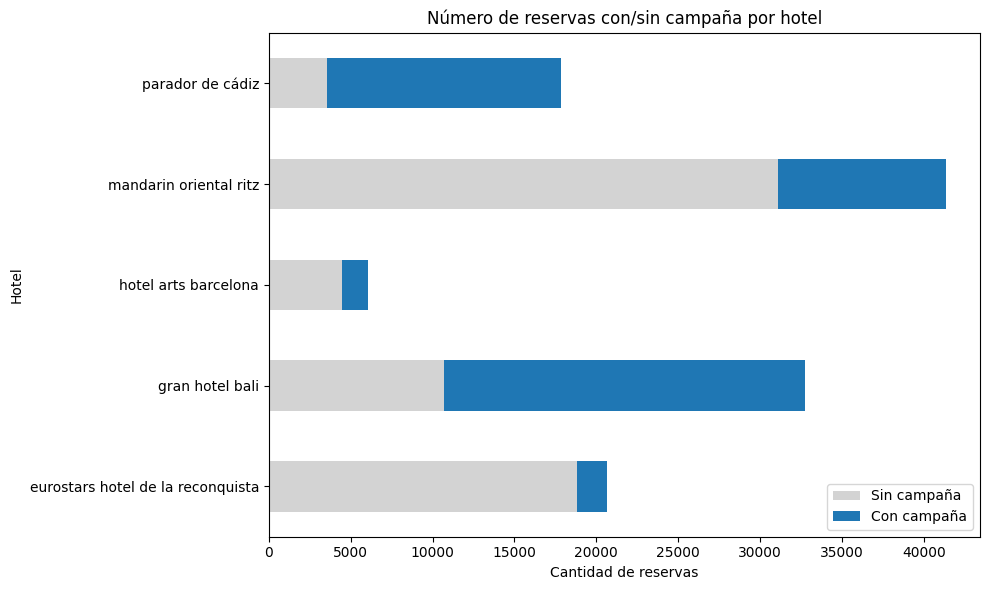

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear columna auxiliar
df_booking['tiene_campaña'] = df_booking['campaña_asignada'].notna()

# Agrupar
conteo = df_booking.groupby(['hotel', 'tiene_campaña']).size().reset_index(name='cuenta')

# Pivotar para gráfico
pivot = conteo.pivot(index='hotel', columns='tiene_campaña', values='cuenta').fillna(0)
pivot.columns = ['Sin campaña', 'Con campaña']

# Gráfico apilado
pivot.plot(kind='barh', stacked=True, figsize=(10, 6), color=['#d3d3d3', '#1f77b4'])
plt.title("Número de reservas con/sin campaña por hotel")
plt.xlabel("Cantidad de reservas")
plt.ylabel("Hotel")
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


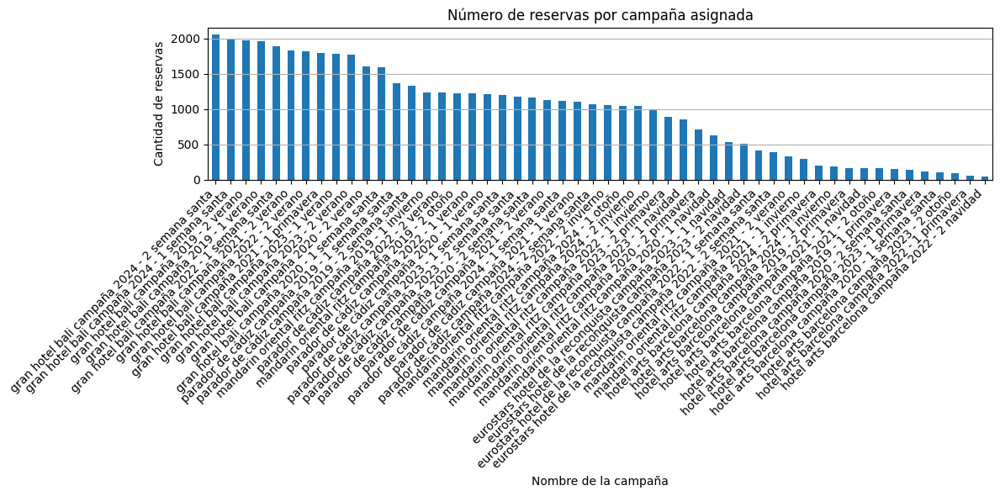

In [6]:
import matplotlib.pyplot as plt
 
# Contar cuántas reservas se asignaron a cada campaña
campaña_counts = df_booking['campaña_asignada'].value_counts().sort_values(ascending=False)
 
# Crear gráfico de barras
plt.figure(figsize=(12, 6))
campaña_counts.plot(kind='bar')
 
plt.title('Número de reservas por campaña asignada')
plt.xlabel('Nombre de la campaña')
plt.ylabel('Cantidad de reservas')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

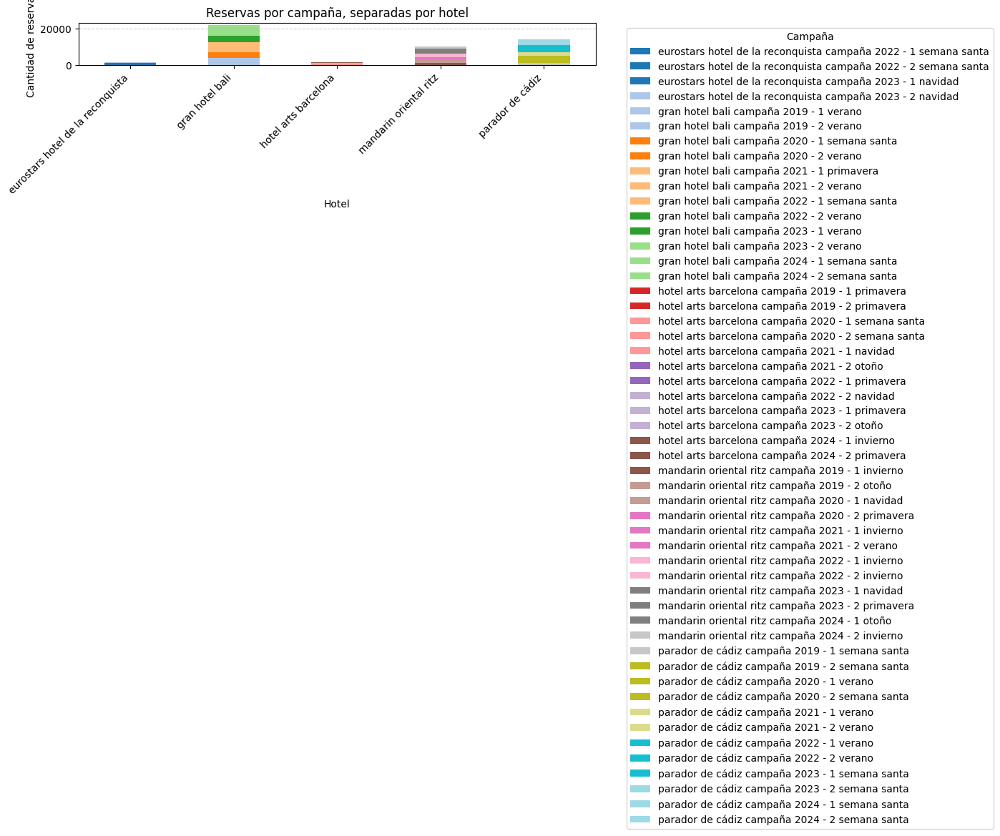

In [7]:
import matplotlib.pyplot as plt
 
# Filtrar solo las reservas con campañas asignadas
df_con_campaña = df_booking[df_booking['campaña_asignada'].notna()]
 
# Agrupar por hotel y campaña
reservas_hotel_campaña = (
    df_con_campaña.groupby(['hotel', 'campaña_asignada'])
    .size()
    .unstack(fill_value=0)
)
 
# Crear gráfico apilado
reservas_hotel_campaña.plot(
    kind='bar',
    stacked=True,
    figsize=(14, 7),
    colormap='tab20'
)
 
plt.title('Reservas por campaña, separadas por hotel')
plt.xlabel('Hotel')
plt.ylabel('Cantidad de reservas')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Campaña', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.6)
 
plt.show()

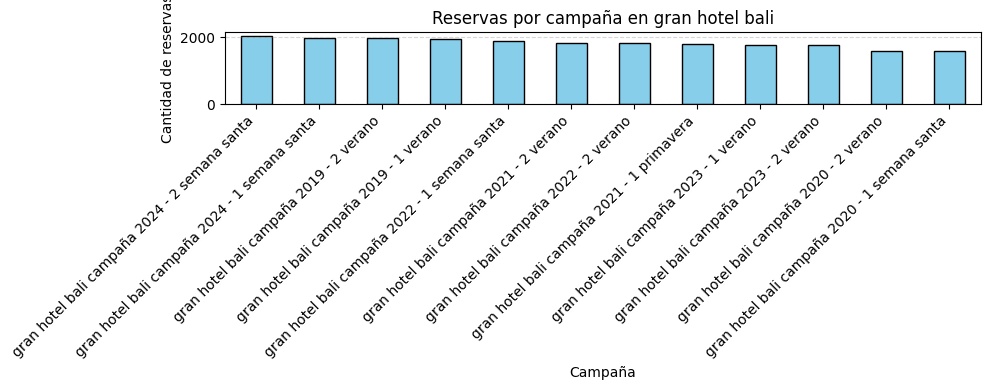

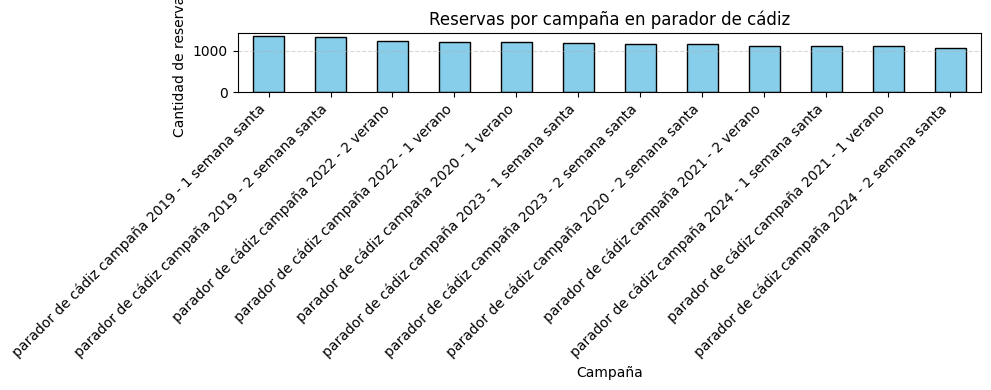

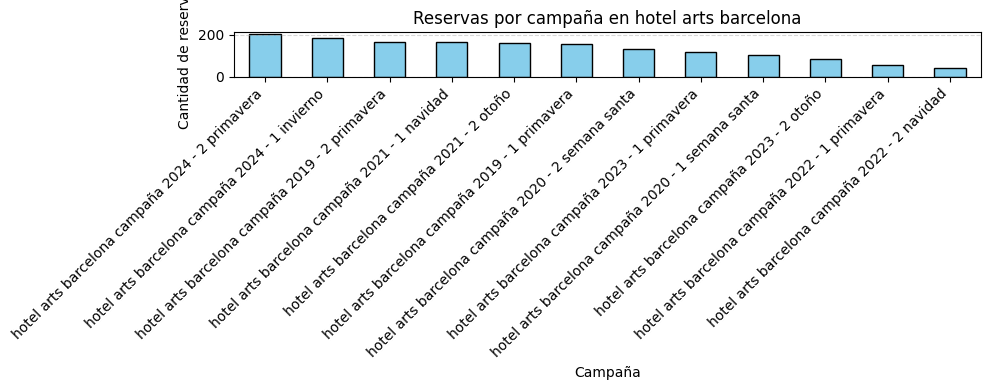

C:\Users\Alumno_AI\AppData\Local\Temp\ipykernel_14388\2150417541.py:21: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


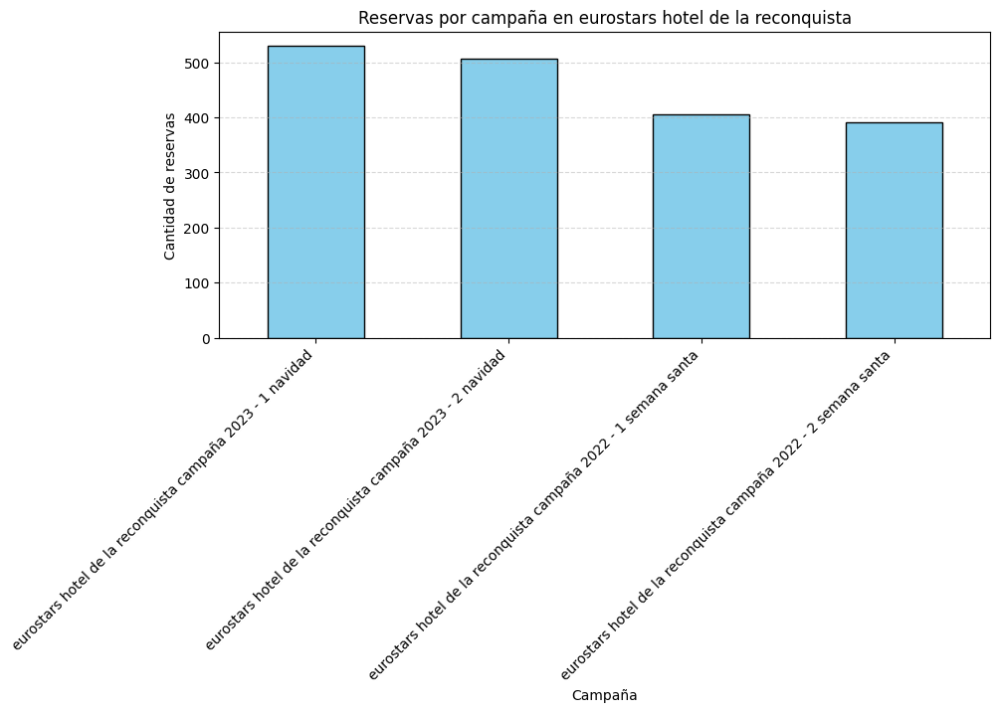

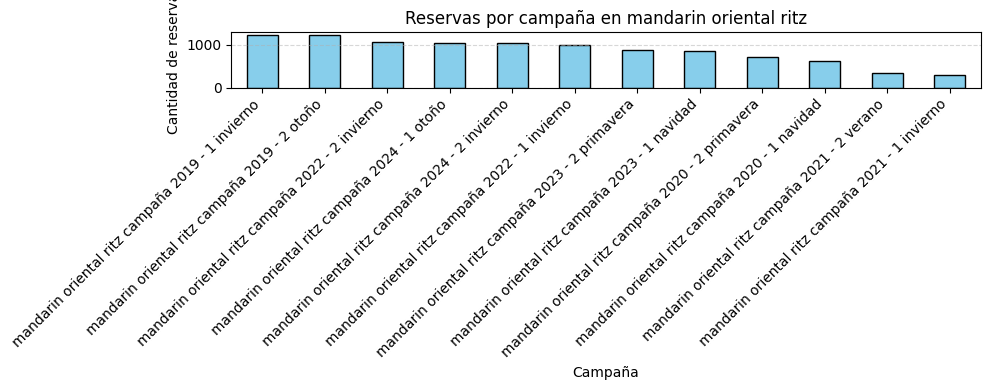

In [8]:
import matplotlib.pyplot as plt
 
# Filtrar reservas que tienen campaña asignada
df_con_campaña = df_booking[df_booking['campaña_asignada'].notna()]
 
# Obtener la lista única de hoteles con campañas
hoteles = df_con_campaña['hotel'].unique()
 
# Crear una gráfica individual por hotel
for hotel in hoteles:
    df_hotel = df_con_campaña[df_con_campaña['hotel'] == hotel]
    conteo = df_hotel['campaña_asignada'].value_counts().sort_values(ascending=False)
   
    plt.figure(figsize=(10, 4))
    conteo.plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Reservas por campaña en {hotel}')
    plt.xlabel('Campaña')
    plt.ylabel('Cantidad de reservas')
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()
 

## Distribuir las reviews
Distribuir las reviews con sus sentiemientos dependiendo el hotel

In [9]:
# Asegura formatos y limpieza
df_booking['hotel'] = df_booking['hotel'].str.strip().str.lower()
df_booking['fecha_llegada'] = pd.to_datetime(df_booking['fecha_llegada'], errors='coerce')
df_review['sentiment'] = df_review['sentiment'].str.lower()


positivas = df_review[df_review['sentiment'] == 'positive']
negativas = df_review[df_review['sentiment'] == 'negative']

# Count reviews by hotel
print("Cantidad de reseñas positivas por hotel:", len(positivas))
print("Cantidad de reseñas negativas por hotel:", len(negativas))


Cantidad de reseñas positivas por hotel: 52155
Cantidad de reseñas negativas por hotel: 47419


In [10]:
# El número representa el procentaje de reseñas positivas
reglas_por_hotel = {
    "parador de cádiz": {
        2019: 0.90,
        2020: 0.80,
        2021: 0.76,
        2022: 0.81,
        2023: 0.79,
        2024: 0.75,
    },
    "eurostars hotel de la reconquista": {
        2019: 0.30,
        2020: 0.39,
        2021: 0.32,
        2022: 0.22,
        2023: 0.23,
        2024: 0.34,
    },
    "gran hotel bali": {
        2019: 0.70,
        2020: 0.76,
        2021: 0.67,
        2022: 0.70,
        2023: 0.75,
        2024: 0.75,
    },
    "mandarin oriental ritz": {
        2019: 0.35,
        2020: 0.20,
        2021: 0.30,
        2022: 0.30,
        2023: 0.45,
        2024: 0.30,
    },
    "hotel arts barcelona": {
        2019: 0.30,
        2020: 0.23,
        2021: 0.32,
        2022: 0.42,
        2023: 0.32,
        2024: 0.40,
    },
}


In [12]:
import numpy as np

def asignar_review(row):
    global positivas, negativas  # Para modificar los DataFrames globales
    hotel = row['hotel']
    year = row['fecha_llegada'].year

    probabilidad = reglas_por_hotel.get(hotel, {}).get(year, 0.5)  # Default: 50% positivo
    random_value = np.random.rand()

    if random_value < probabilidad and not positivas.empty:
        review = positivas.sample(1)
        idx = review.index[0]
        review_row = review.iloc[0]
        positivas = positivas.drop(idx)
        print(f"Total de reseñas positivas restantes: {len(positivas)}")
    elif not negativas.empty:
        review = negativas.sample(1)
        idx = review.index[0]
        review_row = review.iloc[0]
        negativas = negativas.drop(idx)
        print(f"Total de reseñas negativas restantes: {len(negativas)}")
    else:
        return pd.Series({'text': None, 'sentiment': None})

    return pd.Series({
        'text': review_row['text'],
        'sentiment': review_row['sentiment']
    })


In [13]:
df_booking[['review_text', 'review_sentiment']] = df_booking.apply(asignar_review, axis=1)
df_booking.head()

Total de reseñas positivas restantes: 52154
Total de reseñas positivas restantes: 52153
Total de reseñas positivas restantes: 52152
Total de reseñas negativas restantes: 47418
Total de reseñas positivas restantes: 52151
Total de reseñas positivas restantes: 52150
Total de reseñas negativas restantes: 47417
Total de reseñas negativas restantes: 47416
Total de reseñas negativas restantes: 47415
Total de reseñas positivas restantes: 52149
Total de reseñas positivas restantes: 52148
Total de reseñas positivas restantes: 52147
Total de reseñas negativas restantes: 47414
Total de reseñas positivas restantes: 52146
Total de reseñas positivas restantes: 52145
Total de reseñas negativas restantes: 47413
Total de reseñas positivas restantes: 52144
Total de reseñas positivas restantes: 52143
Total de reseñas positivas restantes: 52142
Total de reseñas positivas restantes: 52141
Total de reseñas positivas restantes: 52140
Total de reseñas negativas restantes: 47412
Total de reseñas positivas resta

,hotel,cancelado,regimen,canal_distribucion,tipo_cliente,cliente_recurrente,reservas_previas_no_canceladas,adultos,ninos,hombres,...,plazas_aparcamiento,ubicación,campaña_asignada,lanzamiento_inicio,lanzamiento_fin,fecha_inicio,fecha_fin,tiene_campaña,review_text,review_sentiment
1,gran hotel bali,0,bb,direct,jóvenes,0,0,1,0,1,...,0,benidorm,None,None,None,None,None,False,personal amable zona agradable habitacion ampl...,positive
2,gran hotel bali,0,bb,corporate,jóvenes,0,0,1,0,1,...,0,benidorm,gran hotel bali campaña 2023 - 2 verano,2023-05-02,2023-05-30,2023-06-28,2023-07-25,True,i spent five nights and six days at this estab...,positive
3,gran hotel bali,0,bb,ta/to,tercera edad,0,0,2,0,1,...,0,benidorm,gran hotel bali campaña 2020 - 1 semana santa,2020-03-08,2020-03-18,2020-03-28,2020-04-14,True,this was our 2nd time staying at this hotel we...,positive
4,eurostars hotel de la reconquista,0,bb,ta/to,pareja,0,0,2,0,1,...,0,asturias,None,None,None,None,None,False,we booked a standard room six months before wi...,negative
5,parador de cádiz,0,bb,direct,pareja,0,0,2,0,1,...,0,cádiz,None,None,None,None,None,False,the savoy is an excellent hotel on ocean drive...,positive


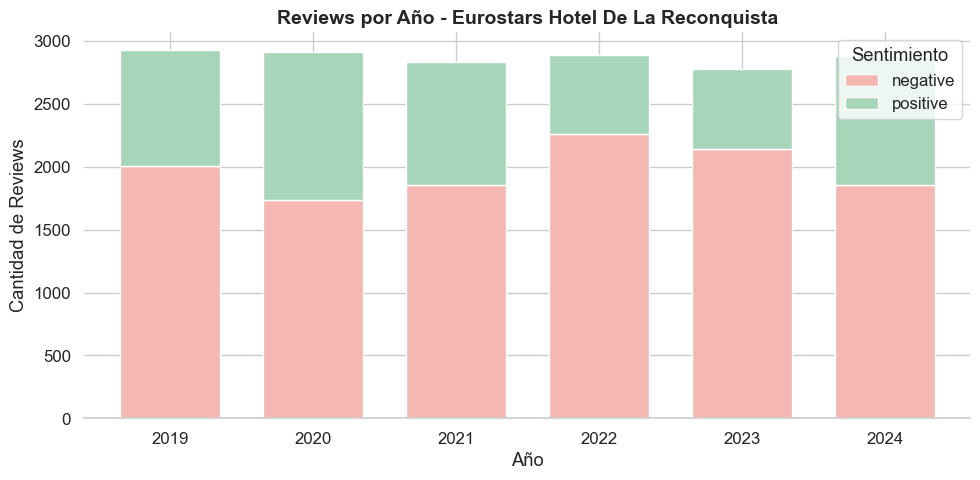

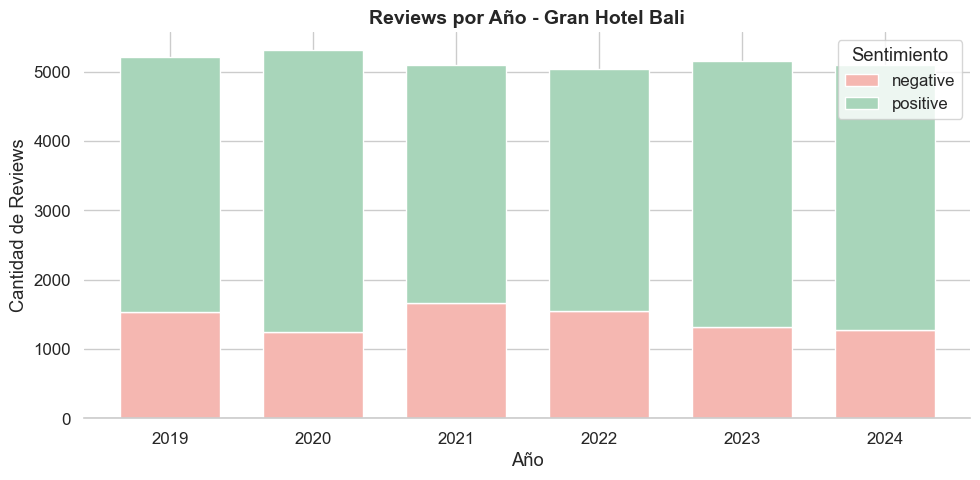

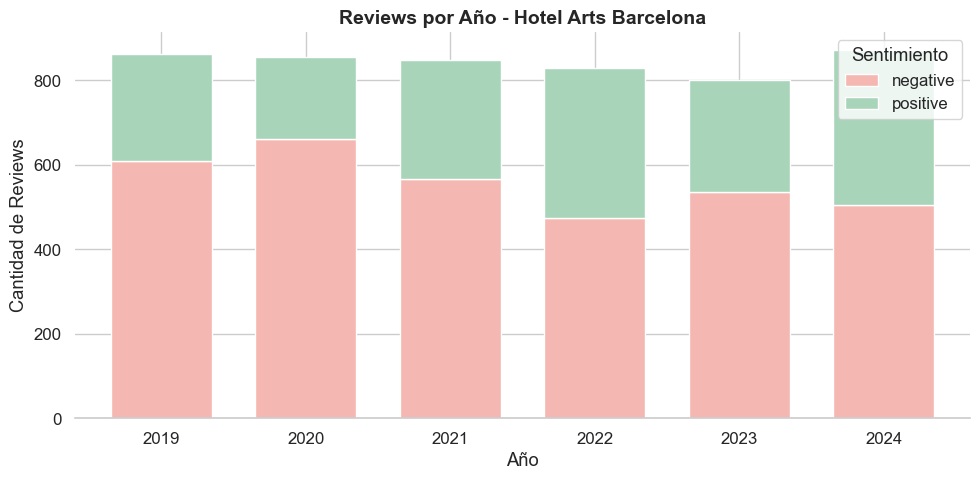

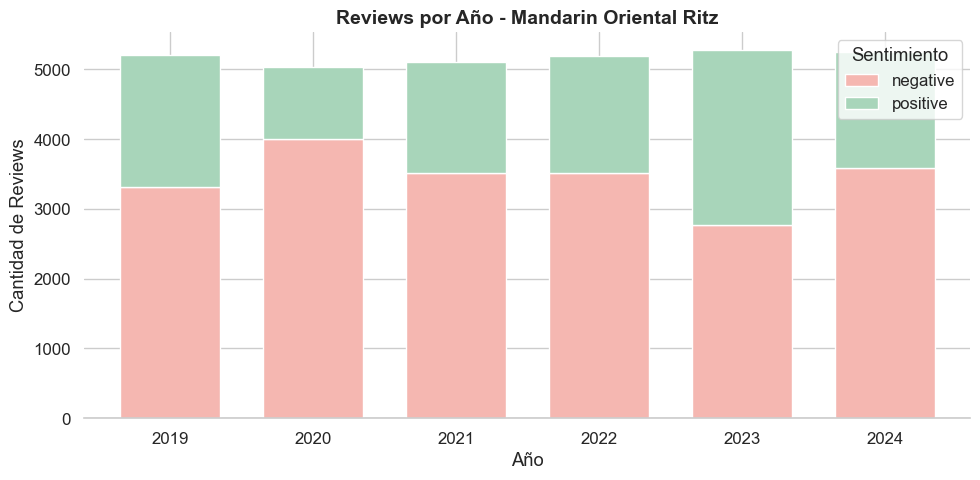

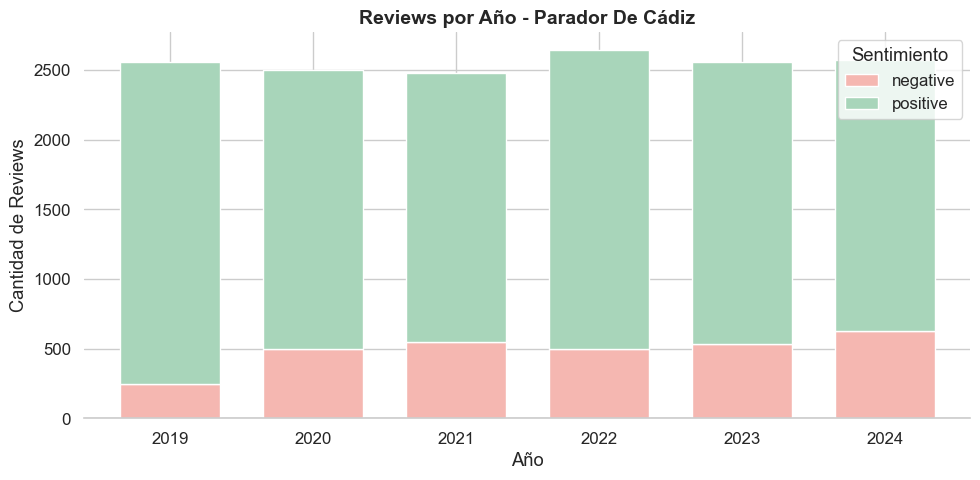

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

# Estilo más bonito
sns.set(style="whitegrid", palette="pastel", font_scale=1.1)
plt.rcParams['axes.edgecolor'] = '#cccccc'
plt.rcParams['axes.linewidth'] = 1.2

# Asegurarse que las columnas están en minúsculas y tipo correcto
df_booking['hotel'] = df_booking['hotel'].str.lower()
df_booking['año'] = df_booking['fecha_llegada'].dt.year

# Agrupar
resumen = (
    df_booking
    .groupby(['hotel', 'año', 'review_sentiment'])
    .size()
    .reset_index(name='conteo')
)

# Obtener hoteles únicos
hoteles = sorted(resumen['hotel'].unique())

# Colores suaves
colores = {'positive': '#A8D5BA', 'negative': '#F5B7B1'}  # Verde tenue y rojo salmón

# Una gráfica por hotel
for hotel in hoteles:
    datos = resumen[resumen['hotel'] == hotel]
    pivot = datos.pivot(index='año', columns='review_sentiment', values='conteo').fillna(0)

    # Plot
    plt.figure(figsize=(10, 5))
    pivot[['negative', 'positive']].plot(
        kind='bar',
        stacked=True,
        color=[colores.get(col, '#ccc') for col in pivot.columns],
        edgecolor='white',
        width=0.7,
        ax=plt.gca()
    )

    plt.title(f"Reviews por Año - {hotel.title()}", fontsize=14, weight='bold')
    plt.xlabel("Año")
    plt.ylabel("Cantidad de Reviews")
    plt.xticks(rotation=0)
    plt.legend(title='Sentimiento')
    sns.despine(left=True)
    plt.tight_layout()
    plt.show()


In [ ]:
!pip install nltk wordcloud matplotlib pandas deepl

In [16]:
# Importar bibliotecas
import nltk
import pandas as pd
from nltk.corpus import stopwords
from googletrans import Translator
from wordcloud import WordCloud
import matplotlib.pyplot as plt


import deepl
import os
from dotenv import load_dotenv

load_dotenv()

# Configurar autenticación de DeepL

auth_key = os.getenv("DEEPL_API_KEY")
translator = deepl.Translator(auth_key)

# Descargar stopwords
nltk.download('stopwords')

# Definir stopwords español e inglés
stop_words = set(stopwords.words('spanish') + stopwords.words('english'))

# Agregar stopwords personalizadas
stop_words.update([
    # Español
    'hotel', 'bien', 'mal', 'bueno', 'buena', 'buen', 'malo', 'en', 'y', 'de', 'la', 'el', 'los', 'las',
    'un', 'una', 'con', 'por', 'para', 'que', 'se', 'del', 'al', 'lo', 'su', 'sus',
    'ir', 'está', 'están', 'estoy', 'estás', 'estamos', 'estáis', 'esté',
    'estén', 'ser', 'soy', 'eres', 'somos', 'sois', 'sea', 'sean', 'tener', 'tengo',
    'tienes', 'tenemos', 'tenéis', 'tenga', 'tengan', 'hacer', 'hago', 'haces',
    'hacemos', 'hacéis', 'haga', 'hagan', 'decir', 'digo', 'dices', 'decimos',
    'de', 'se', 'si', 'excelente', 'ir', 'va', 'van', 'vamos', 'fue', 'fueron',
    'servicio'
])

# Función para eliminar stopwords
def remove_stopwords(text):
    if not isinstance(text, str):
        return ""
    words = text.split()
    filtered = [word for word in words if word.lower() not in stop_words]
    return " ".join(filtered)

 
# Función adaptada para traducir lista de palabras únicas usando DeepL
def traducir_palabras_unicas(palabras, idioma_destino='ES'):
    palabras_traducidas = {}
    try:
        traducciones = translator.translate_text(palabras, target_lang=idioma_destino)
        for palabra, traduccion in zip(palabras, traducciones):
            palabras_traducidas[palabra] = traduccion.text
    except Exception as e:
        print(f"Error de traducción: {e}")
        palabras_traducidas = {palabra: palabra for palabra in palabras}  # fallback original si falla traducción
    return palabras_traducidas


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Alumno_AI\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


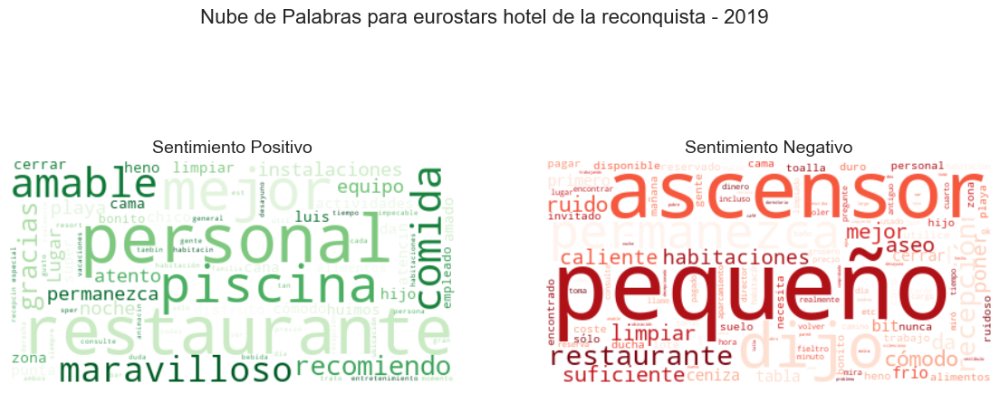

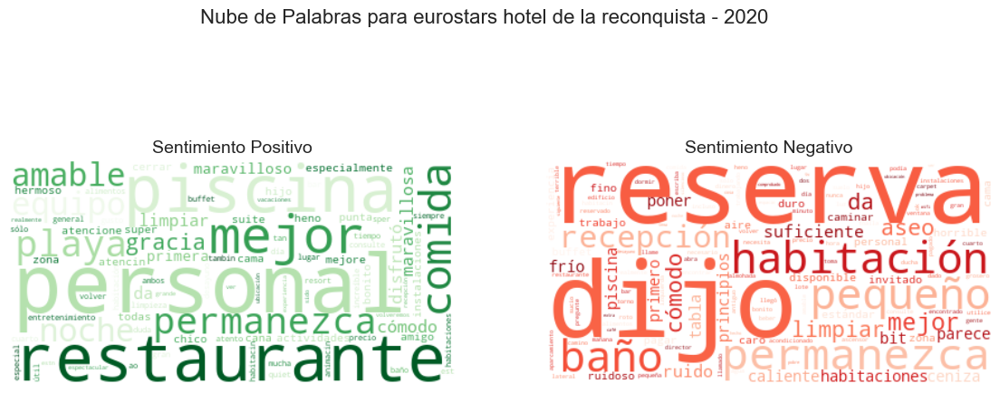

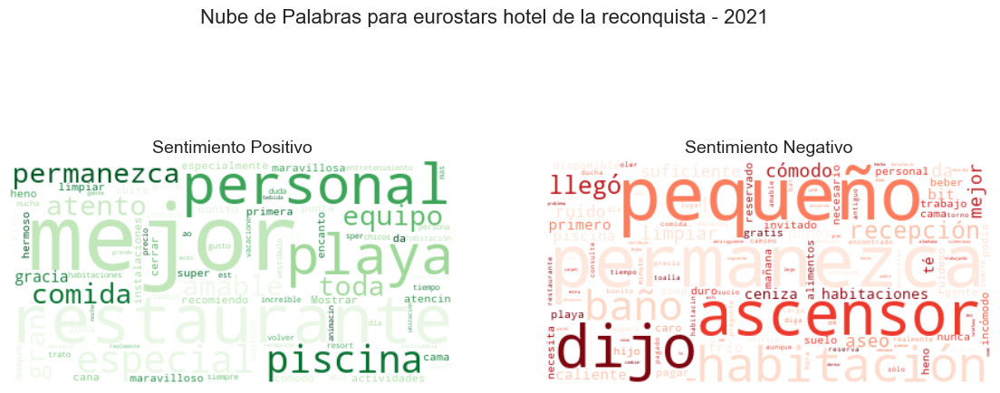

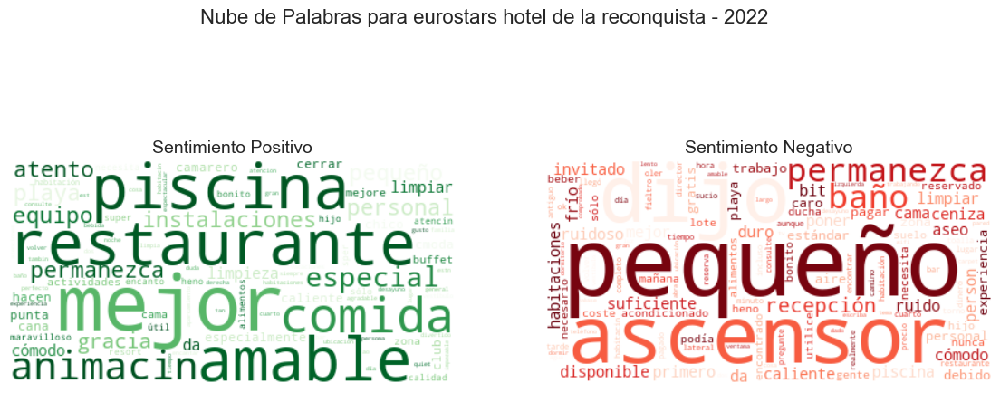

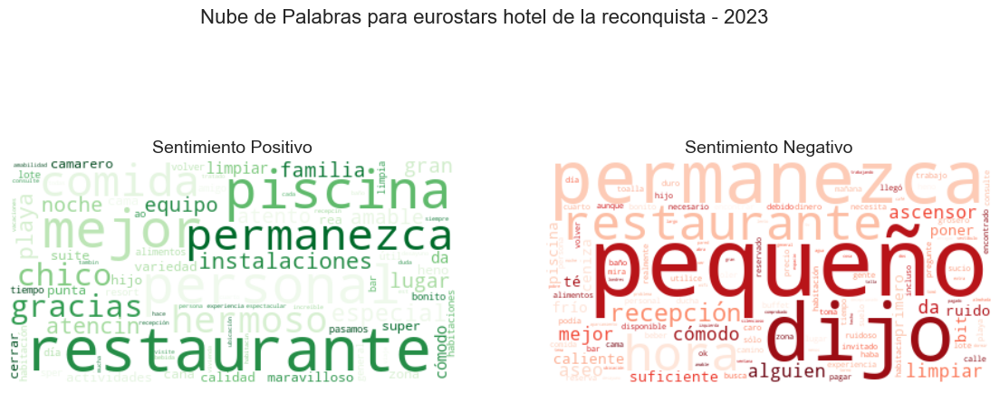

...

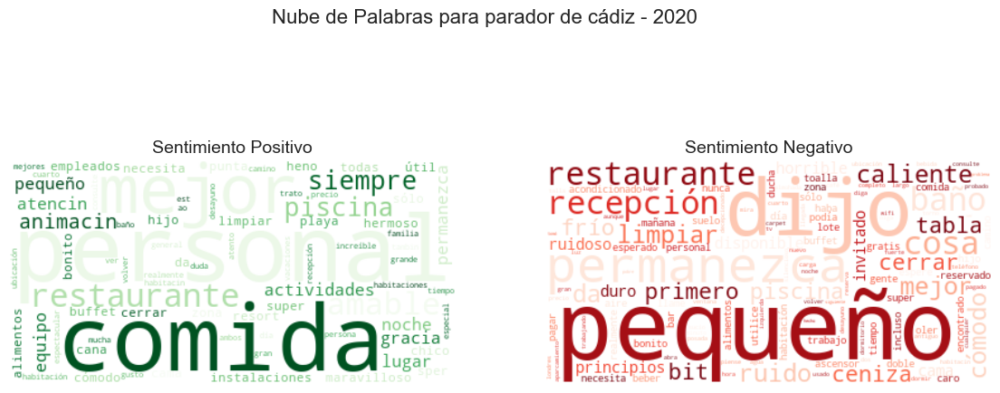

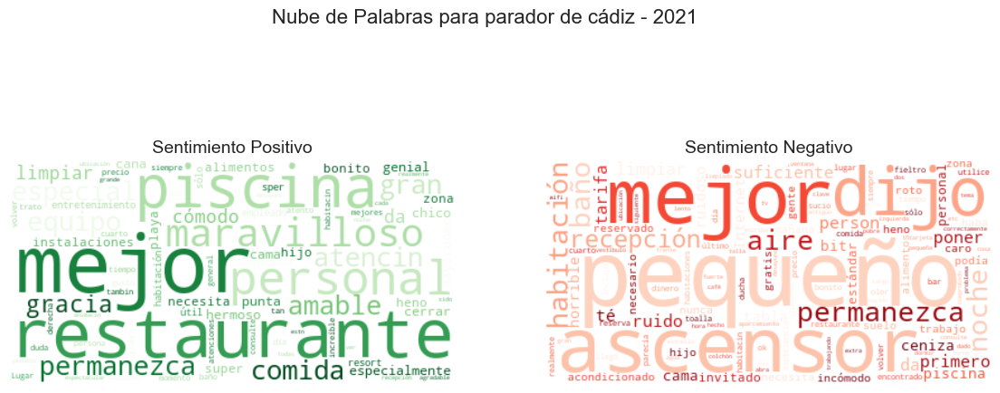

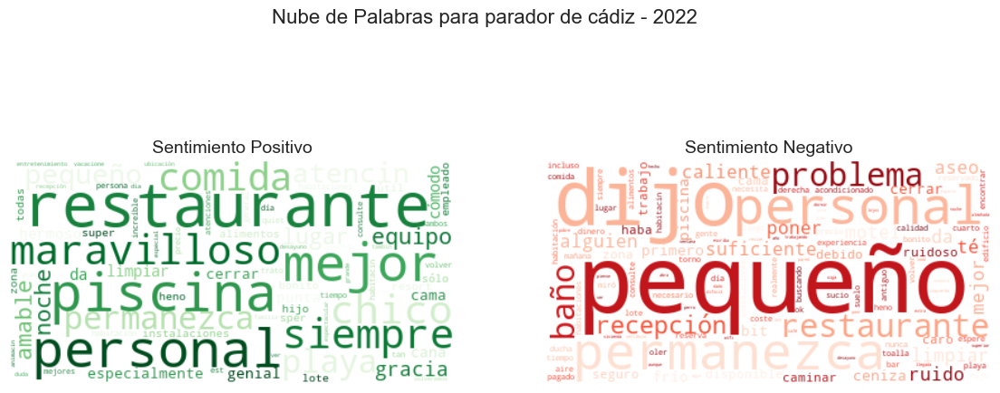

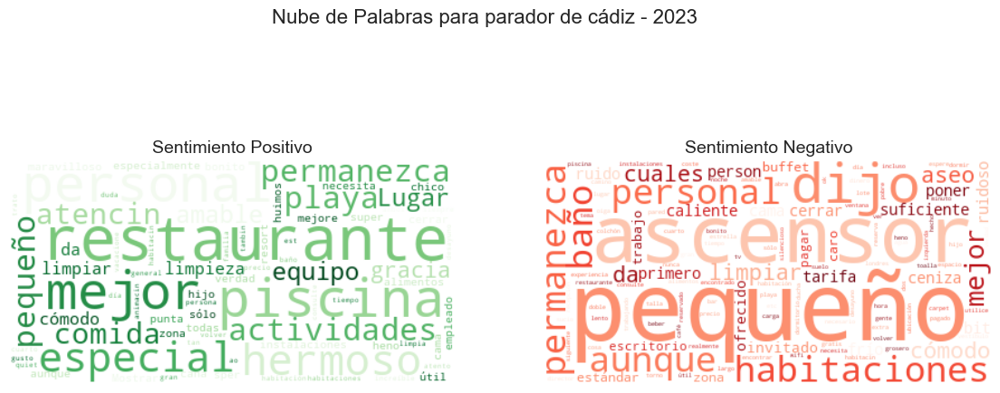

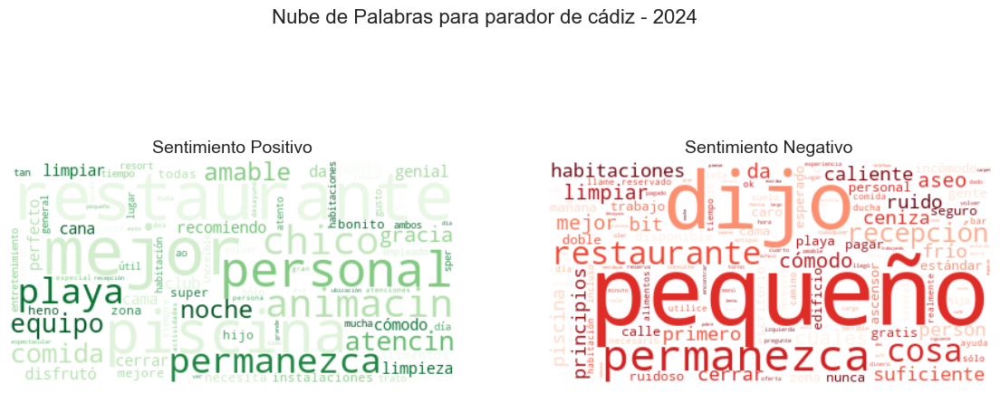

In [17]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def procesar_y_graficar(df_group, hotel, year):
    textos_positivos = df_group[df_group['review_sentiment'] == 'positive']['review_text']
    textos_negativos = df_group[df_group['review_sentiment'] == 'negative']['review_text']

    if textos_positivos.empty and textos_negativos.empty:
        print(f"No hay datos para {hotel} año {year}")
        return

    def preparar_texto_para_nube(textos):
        if textos.empty:
            return ""

        # Extraer palabras únicas con WordCloud (solo para sacar keys)
        wc_temp = WordCloud().generate(" ".join(textos))
        palabras_unicas = set(wc_temp.words_.keys())

        # Traducir palabras únicas
        traducciones = traducir_palabras_unicas(palabras_unicas, 'ES')

        # Limpiar con remove_stopwords y filtrar None o vacíos
        palabras_filtradas = [remove_stopwords(palabra) for palabra in traducciones.values()]
        palabras_filtradas = [p for p in palabras_filtradas if p and len(p) > 1]

        # Reconstruir texto limpio para la nube
        texto_limpio = " ".join(palabras_filtradas)
        return texto_limpio

    texto_positivo_limpio = preparar_texto_para_nube(textos_positivos)
    texto_negativo_limpio = preparar_texto_para_nube(textos_negativos)

    # Crear nubes con texto limpio
    wc_pos = WordCloud(width=400, height=200, background_color='white', colormap='Greens').generate(texto_positivo_limpio) if texto_positivo_limpio else None
    wc_neg = WordCloud(width=400, height=200, background_color='white', colormap='Reds').generate(texto_negativo_limpio) if texto_negativo_limpio else None

    # Mostrar gráficos lado a lado
    fig, axs = plt.subplots(1, 2, figsize=(14,6))
    fig.suptitle(f'Nube de Palabras para {hotel} - {year}', fontsize=16)

    if wc_pos:
        axs[0].imshow(wc_pos, interpolation='bilinear')
        axs[0].set_title('Sentimiento Positivo', fontsize=14)
    else:
        axs[0].text(0.5, 0.5, 'No hay datos positivos', ha='center', va='center')
    axs[0].axis('off')

    if wc_neg:
        axs[1].imshow(wc_neg, interpolation='bilinear')
        axs[1].set_title('Sentimiento Negativo', fontsize=14)
    else:
        axs[1].text(0.5, 0.5, 'No hay datos negativos', ha='center', va='center')
    axs[1].axis('off')

    plt.show()

# Aplicar para cada grupo (hotel, año)
for (hotel, year), grupo in df_booking.groupby(['hotel', 'año']):
    procesar_y_graficar(grupo, hotel, year)


In [26]:
# agrergar una columna categorica si tiene campaña o no
df_booking['tiene_campaña'] = df_booking['campaña_asignada'].notna().astype(int)


In [27]:
# Exportar a CSV
df_booking.to_csv('../data/processed/booking_data.csv', index=False)


In [25]:
import pandas as pd

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df_booking.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118675 entries, 1 to 118675
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           118675 non-null  object        
 1   cancelado                       118675 non-null  object        
 2   regimen                         118675 non-null  object        
 3   canal_distribucion              118675 non-null  object        
 4   tipo_cliente                    118675 non-null  object        
 5   cliente_recurrente              118675 non-null  object        
 6   reservas_previas_no_canceladas  118675 non-null  object        
 7   adultos                         118675 non-null  object        
 8   ninos                           118675 non-null  object        
 9   hombres                         118675 non-null  object        
 10  mujeres                         118675 non-null  object 